---
Work done by **DAGHMOURA Haithem** and **ZAIRI Kais**

---

# TO delete

In [1]:
import os

from google.colab import drive
drive.mount('/content/drive/')

os.chdir('/content/drive/MyDrive/Telecom/IMA208/TP-5-Homgraphy/TP 5 - homography estimation-20240318')
current_directory = os.getcwd()
print(current_directory)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content/drive/MyDrive/Telecom/IMA208/TP-5-Homgraphy/TP 5 - homography estimation-20240318


# IMA 208 TP5: homography estimation

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In this practical work, we will study how to estimate an homography between two given images. We will consider both the simple DLT algorithm (part I) and the RANSAC algorithm (part II).

To reduce the time you need for this practical work, we will use a few pre-implemented functions of openCV. Make sure that your library installation is correct before starting to work.

# Part 1: homography estimation from hand-selected keypoints: DLT algorithm

We assume that we have an image of a documents suffering from severe perspective distortion. The objective of this part is to warp this image (denoted in the following as img2) to remove the distortion using a reference image beeing in the desired pose (denoted as img1).

The following cell enables to vizualize the images using openCV.

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7e16cd47d390>)

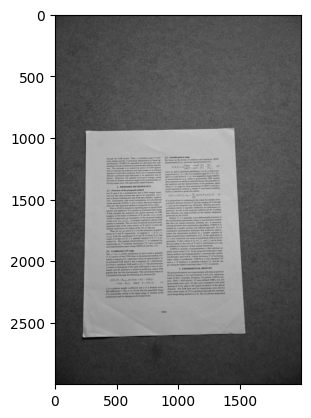

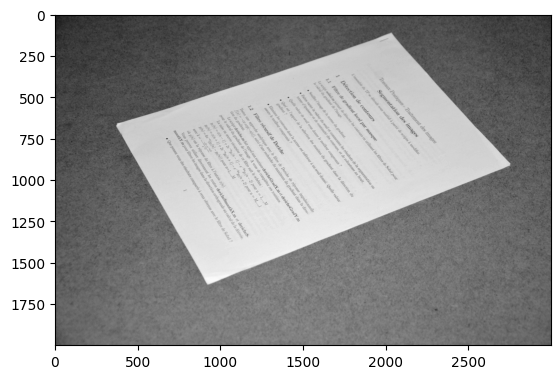

In [3]:
img1 = cv2.cvtColor(cv2.imread('Feuille_redressee.jpg'),cv2.COLOR_BGR2GRAY) # Reference image
img2 = cv2.cvtColor(cv2.imread('Feuille.jpg'),cv2.COLOR_BGR2GRAY) # Image to be processed

plt.figure(),plt.imshow(img1,cmap='gray')
plt.figure(),plt.imshow(img2,cmap='gray')

To correct the homography beetween the to images, we will need some points to match between the two images.

**Question:** how many points do you at least need to estimate the homography? Why?

**Answer:**
At least, We need 4 points that are not colinear. In fact, For estimating a single homography between two images, there are 8 dof and as already seen, each point has 2 dof therefore, except in degenerated cases (colinear points), 4 points are in principle sufficient to
estimate the homography

**Implementation:** to estimate the homography, some matching keypoints between the reference image and the to-be-porcessed one are given below. They here correspond to the corners of the two documents.

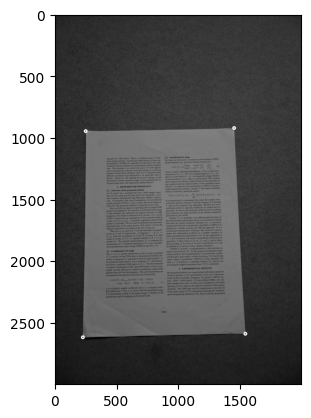

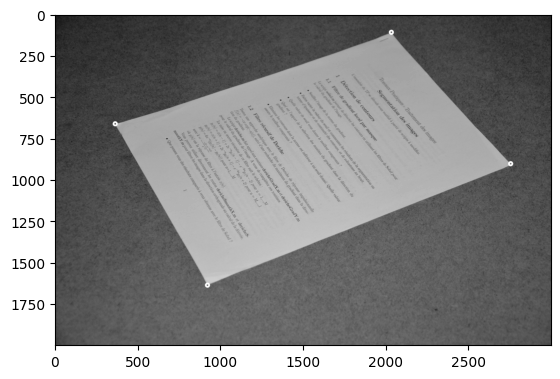

In [4]:
pts1 = [[248,949],[1450,924],[1541,2592],[225,2621]] # Keypoints for img1. Should be a list in format [[first_point_row,first_point_column],[second_point_row,second_point_column],...]
pts2 = [[2030,110],[2750,904],[920,1638],[363,663]] # Keypoints for img2,  keep the same order of the points as pts1.

# Below, we convert the points you found above into cv2 points object for vizualization (no need to change anything)
kp1 = [cv2.KeyPoint(pt[0], pt[1], 1) for pt in pts1]
kp2 = [cv2.KeyPoint(pt[0], pt[1], 1) for pt in pts2]

for i in range(len(pts1)):
    img1c=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c,cmap='gray')

for i in range(len(pts2)):
    img2c=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c,cmap='gray')

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2,number_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2,number_of_points

**Visualize** the keypoints you found above to check that they are properly assigned.

Now, we will start implementing the DLT.

**Question:** recall what the DLT is. Give a pseudo code. What are its potential flaws and strengths?

**Answer:**

Direct Linear transform (DLT) is an algorithm that allows us to estimate the homogeneous matrix H given a set of 2d points matchs.

Pseudo code :

(i) Normalize the set of points $x$ and $x'$ for better conditionning.

(ii) For each correspondence $\{x_i ↔ x_i' \}$ compute the matrix A given by the equation (4.1) in the course.

(iii) Assemble the $n2 \times 9$ matrices $A_i$ into single $2n\ \times 9$ matrix $A$.

(iv) Obtain the SVD of A. The unit singular vector corresponding  to the smallest singular value is the solution h. Specifically if $\mathbf{A=UDV^T}$ with $D$ diagonal with positive diagonal entries, arranged in descending order down the diagonal, then h is the last column of V.

(v) The matri H is extracted from h


The first step of the DLT algorithm is to normalize the image point.

**Question:** Recall why the normalization is important. Recall how to do it.

**Answer:**

The normalization is important because the points generally have differnt order of magnitude for instance the points $x = (100,100,1) $ and $x' = (100,100,1)$ which represents a legitame orer of maginitude with the two first coordantes representing the indices of the points in the image and the last coordinate being added to obtain the homogeneous representation. This will lead to a ill-conditionned matrix A. This will affect the SVD decomposition leading to bad results.

In order to normalize we follow these steps :

(i) Normalization of $x$ : Compute a similarity transformation T, consisting of a translation and scaling, that takes points $x_i$ to a new set of points $\tilde x_i$ such that the centrois of the points $\tilde x_i$ is the coordinate origin and their average distance from the origin is $\sqrt 2$.

(ii) Normalization of $x'$ : Computea similar transformation $T'$ for the points in the second image, transforming points $x_i'$ to $\tilde x_i'$

In the following, we will perform the normalization using the so called *homogeneous* coordinates of the keypoints. The main idea is to add a last coordinate equal to one for each point. The point (x,y) thus becomes (x,y,1) in homogeneous coordinate.

The advantage is that we will be able to do the normalization using a simple matrix product : X_norm = T@X.

**Fill** the blanks in the below implementation.

In [5]:
def normalize_image_points(imageEucl):
    """
    Input: 2D list with x,y image points
    Output: normalized data points
    """

    #print("Normalizing data using similarity matrix...")

    mean, std = np.mean(imageEucl,axis=1), np.std(imageEucl) # To be filled, (elementwise) mean and std of the data points

    image = np.vstack([imageEucl, np.ones(imageEucl.shape[1])]) # Image in homogeneous coordinate

    # Define a similarity matrix enabling to normalize the data. Write the cooefficients in Tranformation such that image_norm = image@Transformation
    Transformation = np.array([[std/np.sqrt(2), 0, mean[0]],
                               [0, std/np.sqrt(2), mean[1]],
                               [0, 0, 1]])
    Transformation = np.linalg.inv(Transformation)

    # Apply transformation on data points
    image_norm = Transformation@image

    # Retrieve normalized image in the original input shape (25, 2)
    image_norm = image_norm[0:2,:]

    return image_norm, Transformation




In [6]:
normalize_image_points(np.array(pts1))

(array([[-1.00759739,  0.95216323,  1.10053113, -1.04509697],
        [-1.34101756, -1.38177798,  1.33775673,  1.38503881]]),
 array([[ 1.63041649e-03,  0.00000000e+00, -1.41194068e+00],
        [ 0.00000000e+00,  1.63041649e-03, -2.88828281e+00],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]))

**Question:** Verify that your data looks properly normalized.

**Answer**

After applying the normalization our data looks good : we have the same order of magnitude of elements in the array (all elements $≃ 1$)

In [7]:
normalize_image_points(np.array(pts1))

(array([[-1.00759739,  0.95216323,  1.10053113, -1.04509697],
        [-1.34101756, -1.38177798,  1.33775673,  1.38503881]]),
 array([[ 1.63041649e-03,  0.00000000e+00, -1.41194068e+00],
        [ 0.00000000e+00,  1.63041649e-03, -2.88828281e+00],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]))

The second step is to compute the A matrix from the normalized data points.

**Fill** the blanks in the function below.

**Question:** justify the shape of the A matrix.

**Answer:**

Here $A$ is composed of stacked matrices $A_i$ where each matrix $A_i$ is obtained from a matching pair $x_i ↔ x_i'$ and verifies the equation : $A_ih=0$ with h  obtained from the elements of the homography matrix.

$A$ has the shape $(2\times nbr\ matches,9)$. Let's break this down:
The first dimension is $2\times nbr\ matches$ : this represents the stacked matrices $A_i$ dimension which is 2 multiplied by the number of matches (matrices) we have.

The second dimension is $9$ and represents the fact that the A must fulfill the equation $Ah=0$ with $h$ having shape $(9,1)$

In [8]:
def compute_matrix_A(points1, points2, no_points):
    """
    Input: Already normalized correspondences for image1 and image2
    Output: Matrix A as defined in Zisserman p. 91
    """

    A = []

    for i in range(0, no_points):
        x, y = points1[0, i], points1[1, i] # Denote the coordinate in image 1 x and y for shortcut
        x_prime, y_prime = points2[0, i], points2[1, i] # Denote the coordinate in image 2 x_prime and y_prime for shortcut

        # Create A_i according to the fomula given in class
        # here we are assuming w_i and w_i_prime are one
        A.append([0, 0, 0, -x, -y, -1, y_prime*x, y_prime*y, y_prime])
        A.append([x, y, 1, 0, 0, 0, -x_prime*x, -x_prime*y, -x_prime])
    #print()
    #print("Stacked matrix A shape:", np.shape(A))

    return np.asarray(A)



We are now ready to code the whole homography computation function.

**Fill** the gaps below.

In [9]:
def compute_homography(pts1,pts2):

    # Set data points to numpy arrays
    no_points = pts1.shape[1] # Number of points

    # Normalize the data
    image1_normalized, T = normalize_image_points(pts1)
    image2_normalized, T_prime = normalize_image_points(pts2)

    # Get matrix A
    # A = ...
    A = compute_matrix_A(image1_normalized, image2_normalized, no_points)

    # Compute SVD of A
    U, S, V = np.linalg.svd(A)
    V = V.T # So that A = USV.T

    # Get last column of V (this is the vector h)
    h = V[:,-1]

    # Obtain homography by reshaping h (H tilde)
    #print()
    #print("Reshaping to get homography H_tilde...")
    H_tilde = h.reshape(3,3)

    # Denormalize to obtain homography (H) using the transformations and generalized pseudo-inverse
    H = np.linalg.pinv(T_prime) @ H_tilde @ T

    #print()
    #print("Denormalized to obtain homography H for 2D data points...")
    #print("Matrix H:")
    #print(H)

    return H

**Question:** Apply the compute_homography function to warp the document image 2 into the perspective of document 1. Any comment ?

**Answer:**

We noitice that we have succeeded in our task. We managed to transform the document with its contents into the target's perspective. Even the writing is still clear and can be read (if you try and download the array it should be visibale in .png format).

Upon inspecting the Homogenous transformation matrix we see that we are in the general case of affine transformation with 6 dof ($H_{31} = H_{32} = 0$ and  $H_{3,3} = 1$ )  

[[ 2.960000e-01 -9.640000e-01  2.808673e+03]
 [ 5.600000e-01  3.240000e-01 -3.398110e+02]
 [-0.000000e+00 -0.000000e+00  1.000000e+00]]


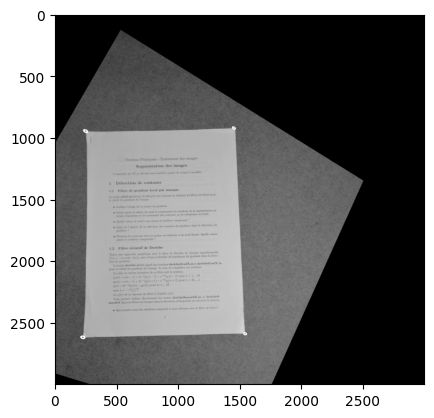

In [10]:
H = compute_homography(pts1,pts2)
homography_matrix_normalized = H/ H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')
print(np.round(homography_matrix_normalized,3))

**Question:** test the sensitivity of the above algorithm to errors in the matching keypoints. Are you able to obtain good results if you have a false match?

Answer to the same question is you have more matching points than the corners.

**Answer:**

For the first case, when we have 4 points with 2 missmatches, we get a very bad result. The transformation is completly out of the scope of expectation. This is due to the nature of our problem. So in this case the algorithm is sensitive to the errors in the matching keypoints.

For the second case, After increasing the number of matches that we have. Even though we have the same bad missmatch, we get good results when we increase the number of good matches and the algorithm is able to find what we want.

First let's save our optimal transformation

In [11]:
H_opt = H

Now, let's test the sensitivity to errors in matching keypoints. Let's swap the matches between points 3 and 4 and keep the same values

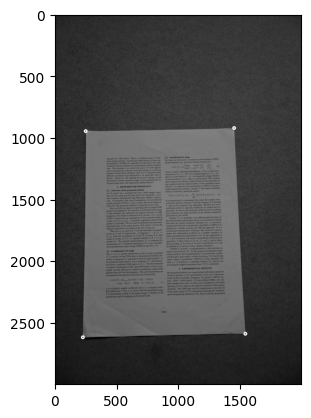

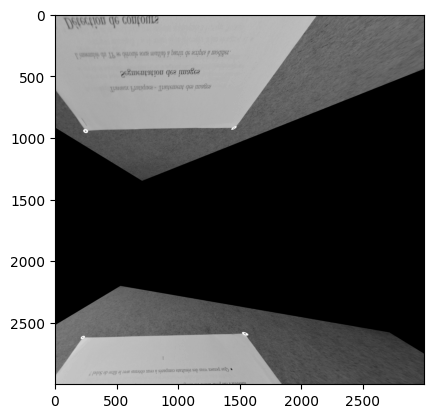

In [12]:
pts1 = [[248,949],[1450,924],[1541,2592],[225,2621]] # Keypoints for img1. Should be a list in format [[first_point_row,first_point_column],[second_point_row,second_point_column],...]
pts2 = [[2030,110],[2750,904],[363,663],[920,1638]] # Keypoints for img2,  keep the same order of the points as pts1.




for i in range(len(pts1)):
    img1c_dec=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c_dec,cmap='gray')

for i in range(len(pts2)):
    img2c_dec=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c_dec,cmap='gray')

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points

H = compute_homography(pts1,pts2)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

In order to answer the second question we need to be able to compute good many good matches. For this, we propose to implement a function to compute the match given a point x and the optimal transformation H

In [13]:
pts1 = np.array([[248,949],[1450,924],[1541,2592],[225,2621]]).T # Keypoints for img1. Should be a list in format [[first_point_row,first_point_column],[second_point_row,second_point_column],...]
pts2 = np.array([[2030,110],[2750,904],[363,663],[920,1638]]).T # Keypoints for img2,  keep the same order of the points as pts1.
def compute_match (points,H):
  result =[]
  for point in points :
    homogenous_point = np.array([point[0],point[1],1])
    transformation = H@homogenous_point
    transformation = transformation/transformation[2]
    result.append([int(transformation[0]),int(transformation[1])])
  result=np.array(result).T
  return result
np.random.seed(42)

num_points = 20  # Adjust this number as needed

# Generate random integer 2D points
random_points = np.random.randint(0, 2001, size=(num_points, 2))

new_matches=compute_match(random_points,H_opt)
new_pts1 = np.concatenate([pts1,random_points.T],axis=1)
new_pts2 = np.concatenate([pts2,new_matches],axis=1)

Now we have the new matches (all are perfect matches except 2 from the previously swapped ones) Let's test out the results

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7e16c33ca320>)

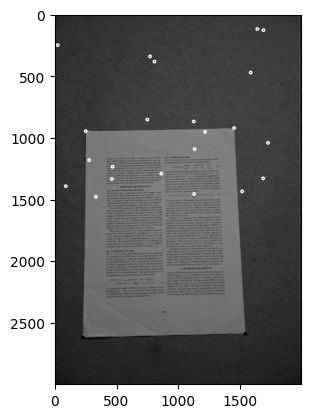

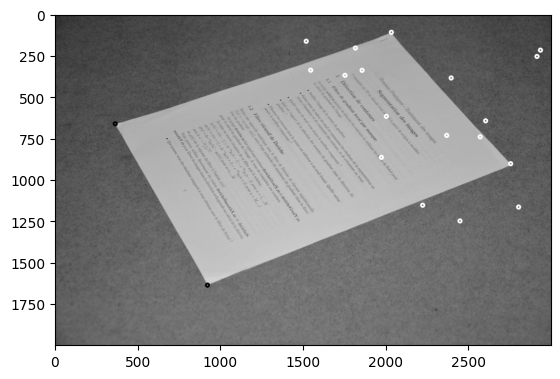

In [14]:
for i in range(len(new_pts1[1])):
    if (i==2 or i==3) :
      img10c_dec=cv2.circle(img1,new_pts1.T[i],radius=10,color=(0,0,0),thickness=10)
    else :
      img10c_dec=cv2.circle(img1,new_pts1.T[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img10c_dec,cmap='gray')

for i in range(len(new_pts2[1])):
    if (i==2 or i==3) :
      img10c_dec=cv2.circle(img2,new_pts2.T[i],radius=10,color=(0,0,0),thickness=10)
    else :
      img20c_dec=cv2.circle(img2,new_pts2.T[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img20c_dec,cmap='gray')


Now let's see the influence of the missmatch when we have 22 other good matches

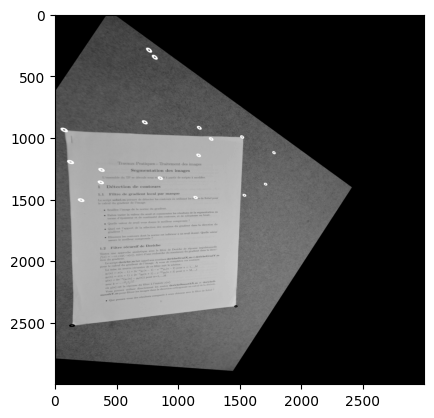

In [15]:
H = compute_homography(new_pts1,new_pts2)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

# Part 2: automatic homography estimation and panorama stitching

To bypass the flaws that we observed with the previous method, we now propose to use a robust homography estimation method, the RANSAC algorithm. As an application, we will consider panorama stitching: from two given overlapping images, create a single one which is a panorama. To do that, we will need to estimate the best homography to warp an image into the perspective of the other. In addition, to avoid the cumbersome choice of the matching points between the two images, we will do an automatic keypoint identification by using the SIFT features.

Let us first load the two considered images.

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7e16cd3f20e0>)

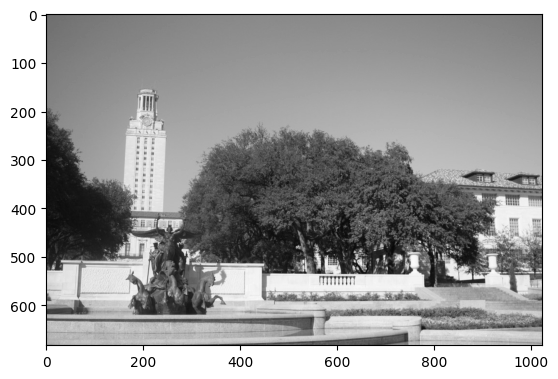

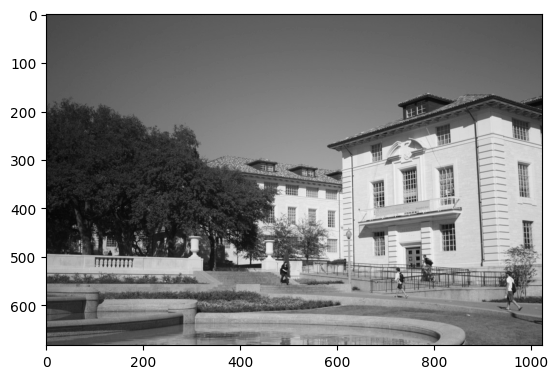

In [16]:
img1c = cv2.cvtColor(cv2.imread('uttower_left.jpg'),cv2.COLOR_BGR2GRAY)
img2c = cv2.cvtColor(cv2.imread('uttower_right.jpg'),cv2.COLOR_BGR2GRAY)

img1 = img1c
img2 = img2c

plt.figure(),plt.imshow(img1,cmap='gray')
plt.figure(),plt.imshow(img2,cmap='gray')

To stitch the two images, we need to have access to pair of corresponding points between image 1 and image 2. To do that, we first need to extract some keypoints in both images (that will be matched later on). We will use here the SIFT descriptors.

**Implement** the SIFT descriptors for both image 1 and image 2. You might be willing to use the cv2.SIFT_create and sift.detectAndCompute.

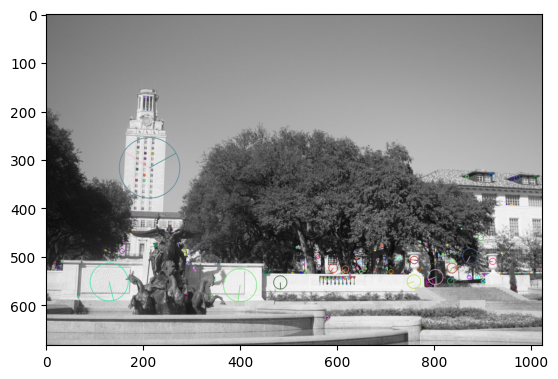

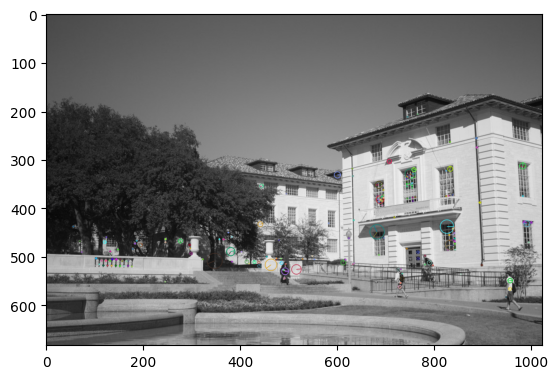

In [17]:
sift = cv2.SIFT_create(contrastThreshold=0.17) # Creates an object of the SIFT class. The larger the threshold, the smaller the number of points
kp1,desc1 = sift.detectAndCompute(img1, None) #kp1 = location of the keypoints, desc1 = corresponding descriptors.

# For visualization
img1c=cv2.drawKeypoints(img1,kp1,img1c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img1c)
plt.show()

kp2,desc2 = sift.detectAndCompute(img2, None) #kp2 = location of the keypoints, desc2 = corresponding descriptors.
img2c=cv2.drawKeypoints(img2,kp2,img2c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img2c)
plt.show()

**Question:** explain the shapes of desc1, kp1 and desc2, kp2 and their respective roles.

In [18]:
print(f"desc1 has shape {desc1.shape}, desc2 has shape{desc2.shape}\nkp1 has shape ({len(kp1)},2), kp2 has shape ({len(kp2)},2) ")

desc1 has shape (281, 128), desc2 has shape(262, 128)
kp1 has shape (281,2), kp2 has shape (262,2) 


**Answer:**

desc1 and descr2 has as first dimension the number of found keypoints in each image. For image 1 we have found 281 relevant descriptor and for image 2 we have found 262 one. The second dimension represents the actual discriptor which consists in the gradient orientation histogram formed with 8 bins in 16 patchs around the specified point coordinate in a given scale.
As for kp1 and kp2 the dimension represents the number of points along the first dimension and the number of coordinates (2 in our case) alongside the second dimension.

Now that we have obtained the SIFT descriptor, we have to match them.

**Complete** the following code.

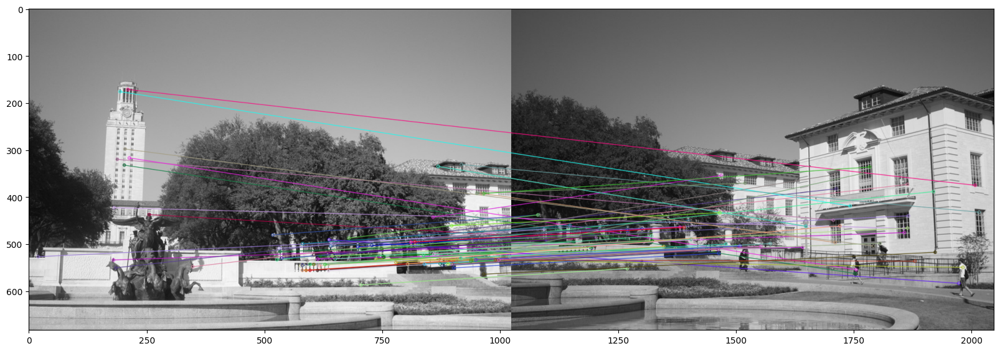

(<Figure size 2000x1200 with 1 Axes>,
 None)

In [19]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(desc1,desc2)

#matches = bf.match(...,...)


# For visualizing the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], img2, flags=2)
plt.figure(figsize=(20,12)),plt.imshow(img3),plt.show()

In [20]:
len(matches)

91

**Question:** comment the match quality. Do you think that the previous matching would enable a decent homography computation using the DLT algorithm of the first part?

**Answer:**

Given that we have 281 descriptors in the first image and 262 the matching algorithm yields 91 pair of points. Upon visualization we noitce that we have a huge number missmatches. For instance the tower and the statue are only present in the first image, however they are present in multiple matching points.

I think that using DLT algorithm will without doubt yield bad results. Because it only works when we have the majority of point in good matches

The following code enables to keep only the coordinates of the 100 best matches in the two images. We will use them as an input of a RANSAC, which will enable to do a robust homography estimation between the two images.

In [21]:
## It is import to take into consideration the case where the number of matches < 100
num_matches = min(100, len(matches))

D1 = np.ones((2,num_matches)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,num_matches)) # Coordinates in image 2 of the first best matching points
for ii in range(num_matches):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)

In [22]:
print(D1.shape)

(2, 91)


Now, we are ready to code the RANSAC algorithm.

**Fill** the gaps in the code below.

In [23]:
def ransac(D1, D2, num, threshold, iterations):
    # D1, D2 : matched points between the two images
    # num : number of points to compute the homography
    # threshold : distance threshold for determining if a pair of point in an inlier or an outlier
    # iterations : number of iterations / number of sampling

    D1h = np.ones((3, D1.shape[1])) # D1h correspond to D1 transformed into homogeneous coordinates
    D1h[0:2,:] = D1

    D2h = np.ones((3, D2.shape[1])) # D2h correspond to D2 transformed into homogeneous coordinates
    D2h[0:2,:] = D2

    n = D1.shape[1] # Number of points in D1


    best_n_inlier = 0
    best_H = np.zeros((3,3)) # Best homography matrix. Fill the gap with a matrix of the right size full of 0.

    for i in range(iterations):
        s = np.random.choice(n, 4, replace=False) # Draw randomly 4 indices to extract 4 points among D1 and D2. You can use np.random.choice()

        pts1 =  D1[:, s] #pts1 is the chosen points among D1
        pts2 =  D2[:, s] #pts2 is the chosen points among D2

        H = compute_homography(pts1, pts2) # Compute the corresponding homography. You can reuse the function of part I.

        D2_new = np.dot(H, D1h) # Transform the points of D1h to be able to compare them to the ones of D2h

        # Normalize D2_new
        D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
        D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
        D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])


        SD = np.sqrt(np.sum((D2h - D2_new)**2, axis=0)) # Compute the distance between D2_new and D2h

        inliers = SD < threshold # Compute the inliers
        num_inlier = np.sum(inliers) # Compute the number of inliers

        if num_inlier > best_n_inlier: # If you obtained the best result, store the corresponding homography
            best_H = H
            best_n_inlier = num_inlier
            point1 = D1[:2, inliers]
            point2 = D2[:2, inliers]
            in_res = SD[inliers]


    return best_H, best_n_inlier, point1, point2, in_res

Using the function you implemented above, **launch the RANSAC algorithm** to estimate the homography between the two images.

In [24]:
threshold = 1;
num = 4;
iterations = 1000;
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

<ipython-input-23-208b58aa1c24>:30: RuntimeWarning: divide by zero encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
<ipython-input-23-208b58aa1c24>:31: RuntimeWarning: invalid value encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
<ipython-input-23-208b58aa1c24>:32: RuntimeWarning: invalid value encountered in divide
  D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])
<ipython-input-23-208b58aa1c24>:31: RuntimeWarning: divide by zero encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])


In [25]:
print(H)

[[ 5.22971266e-01 -4.69421987e-02 -2.21740043e+02]
 [ 6.98467401e-02  4.72188318e-01 -5.85145202e+01]
 [ 1.16948684e-04 -3.71976066e-05  4.24261120e-01]]


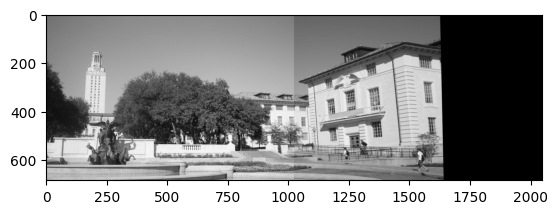

In [26]:
H = H / H[2,2]
result = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1
plt.imshow(result, cmap='gray')

Lastly, **fill the code** below to warp img2 into the same space as img1

In [27]:
result = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

**Question:** Plot the panorama image. How good is it? Any comment?

**Answer**

The stitching technique using SIFT and RANSAC algorithm seems to be good. Given that we have as an input a set of matches with a lot of errors, we are able to find a very good Homography that transforms the second image into the space of the first one. The results are satisfying.

However this technique still lacks one aspect : It doesn't deal with the difference in luminosity between the two images. Even though the structres and the geometry looks coherant we still noitce the big discontinuity in the luminosity between the two images.

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7e16bedf6bf0>)

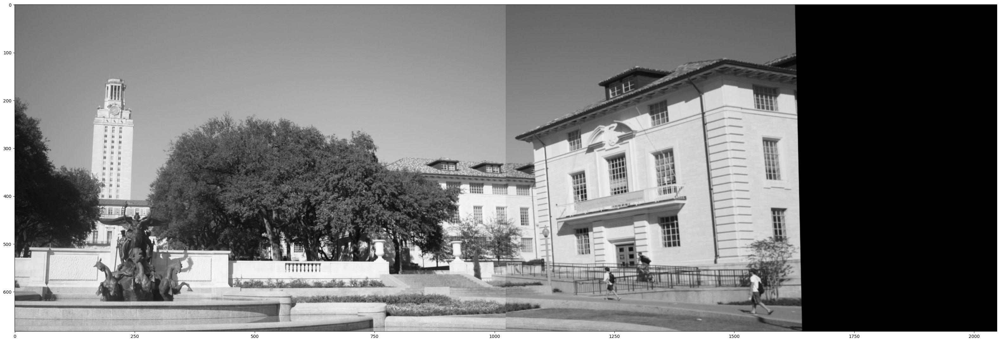

In [28]:
plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

**Bonus**: try other descriptors than the SIFT ones. Try to implement your own.

1. SURF (Speeded-Up Robust Features): SURF is similar to SIFT in many ways, but it’s generally faster. This can be important if you’re working with a large dataset or need to perform real-time processing.
2. ORB (Oriented FAST and Rotated BRIEF): ORB is a fast binary descriptor based on the FAST keypoint detector and the BRIEF descriptor. It’s efficient and robust to rotations, but not scale changes.
3. BRISK (Binary Robust Invariant Scalable Keypoints): BRISK is a fast method for scale and rotation invariant interest point detection and binary feature description.
4. AKAZE (Accelerated-KAZE): AKAZE is a fast multiscale feature detection and description approach for non-linear scale spaces.

  **All are implemented with OpenCV**

911


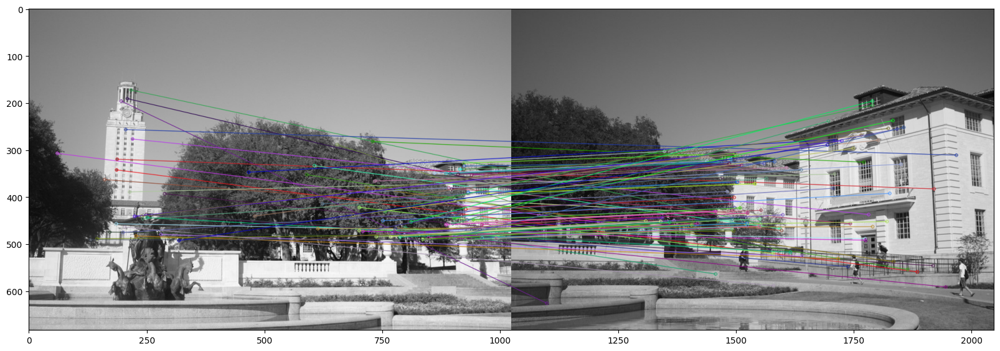

In [29]:
sift = cv2.AKAZE_create()
kp1,desc1 = sift.detectAndCompute(img1, None) #kp1 = location of the keypoints, desc1 = corresponding descriptors.
kp2,desc2 = sift.detectAndCompute(img2, None) #kp2 = location of the keypoints, desc2 = corresponding descriptors.

#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(desc1,desc2)
print(len(matches))

# For visualizing the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], img2, flags=2)
plt.figure(figsize=(20,12)),plt.imshow(img3),plt.show()

npt = min(100, len(matches))
D1 = np.ones((2,npt)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,npt)) # Coordinates in image 2 of the first best matching points
for ii in range(npt):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7e16bed97e20>)

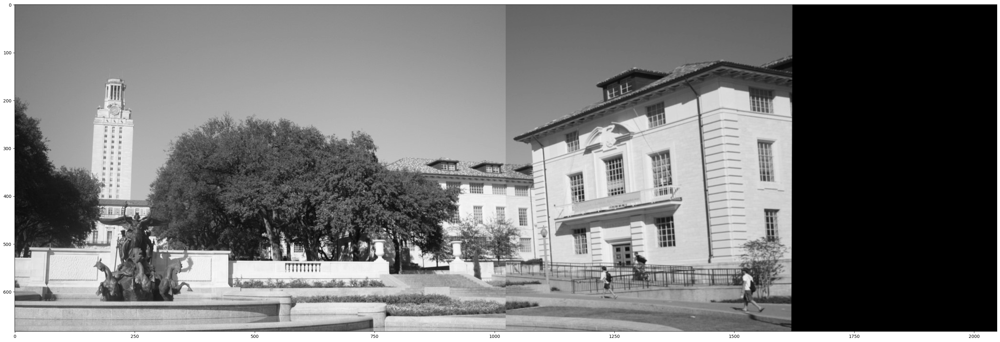

In [30]:
threshold = 1;
num = 4;
iterations = 1000;
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)
H = H / H[2,2]
result = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

**Bonus:** try to correct the change of luminosity between the two images so that the panorama look more realistic.

try to adapt the histogram of the img1 to the histogram of img2: histogram matching.

The result is more realistic.

In [31]:
import cv2
import numpy as np

def hist_match(source, template):
    # Compute the histograms of the source and template images
    src_hist, src_bins = np.histogram(source.flatten(), 256, [0,256])
    tmpl_hist, tmpl_bins = np.histogram(template.flatten(), 256, [0,256])

    # Compute the cumulative distribution functions of the two histograms
    src_cdf = np.cumsum(src_hist) / float(sum(src_hist))
    tmpl_cdf = np.cumsum(tmpl_hist) / float(sum(tmpl_hist))

    # Create a lookup table to map pixel values from the source to the template
    table = np.zeros(256)
    for src_pixel in range(256):
        diff = np.abs(src_cdf[src_pixel] - tmpl_cdf)
        table[src_pixel] = np.argmin(diff)

    # Apply the mapping to the source image
    matched = cv2.LUT(source, table)
    return matched


(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7e16bece44c0>)

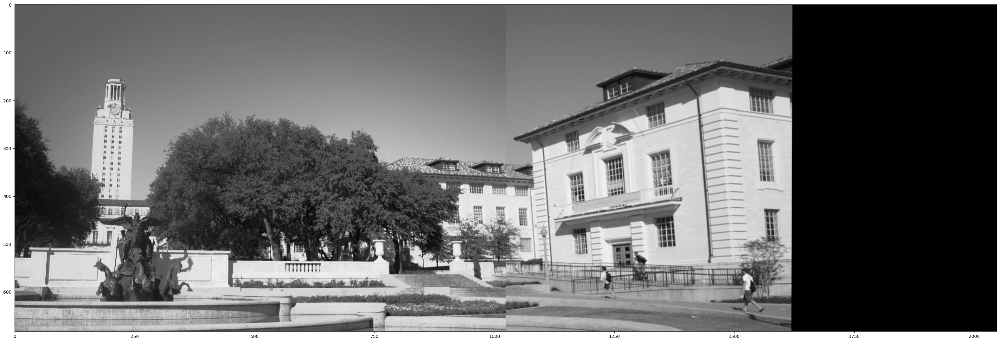

In [32]:
# keep img2 and transform img1

result = cv2.warpPerspective(img2, np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = hist_match(img1, img2)

plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7e16bebce260>)

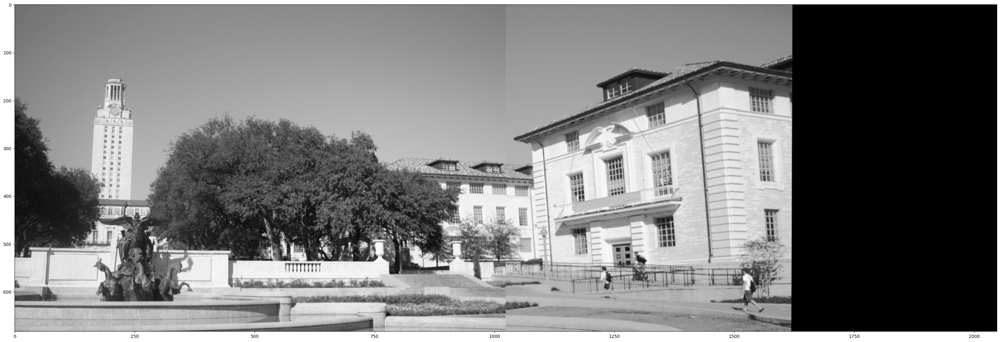

In [33]:
# keep img1 and transform img2

result = cv2.warpPerspective(hist_match(img2, img1), np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7e16bea7cb20>)

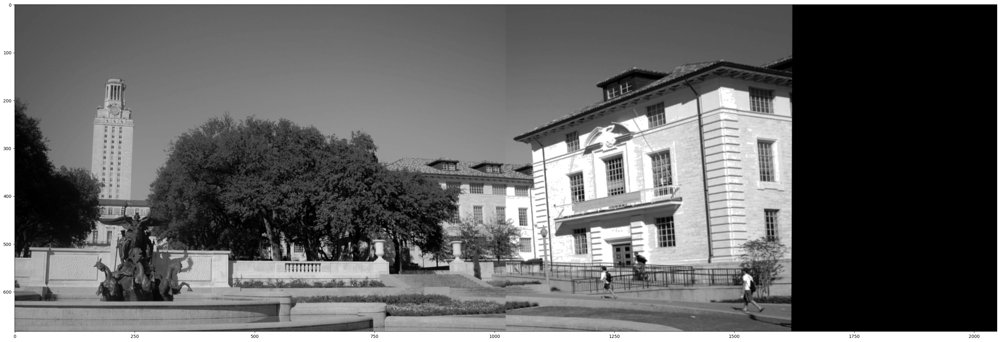

In [34]:
def gain_compensation(img1, img2):
    # Compute the average pixel value in each image
    avg1 = np.average(img1)
    avg2 = np.average(img2)

    # Compute the gain factor
    gain = avg1 / avg2

    # Apply the gain factor to img2
    img2_compensated = cv2.convertScaleAbs(img2, alpha=gain)

    return img2_compensated

result = cv2.warpPerspective(gain_compensation(img1, img2), np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

plt.figure(figsize=(40,20)),plt.imshow(hist_match(result, img1),cmap='gray')

In [35]:
# histogram equalization

result = cv2.warpPerspective(cv2.equalizeHist(img2), np.linalg.inv(H),(img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = cv2.equalizeHist(img1)

plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

Output hidden; open in https://colab.research.google.com to view.